In [1]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

**For info on Image kernels refer to this blog : https://setosa.io/ev/image-kernels/**

# Convenience Functions

In [14]:
def load_img():
    img = cv2.imread("C:/Users/dell/Documents/Udemy OpenCV course/bricks.jpg").astype(np.float32)/255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [ ]:
("C:/Users/dell/Documents/Udemy OpenCV course/bricks.jpg")

In [15]:
def show_pic(img):
    fig = plt.figure(figsize=(15,15))
    ax = fig.add_subplot(1,1,1)
    ax.imshow(img, cmap='gray')

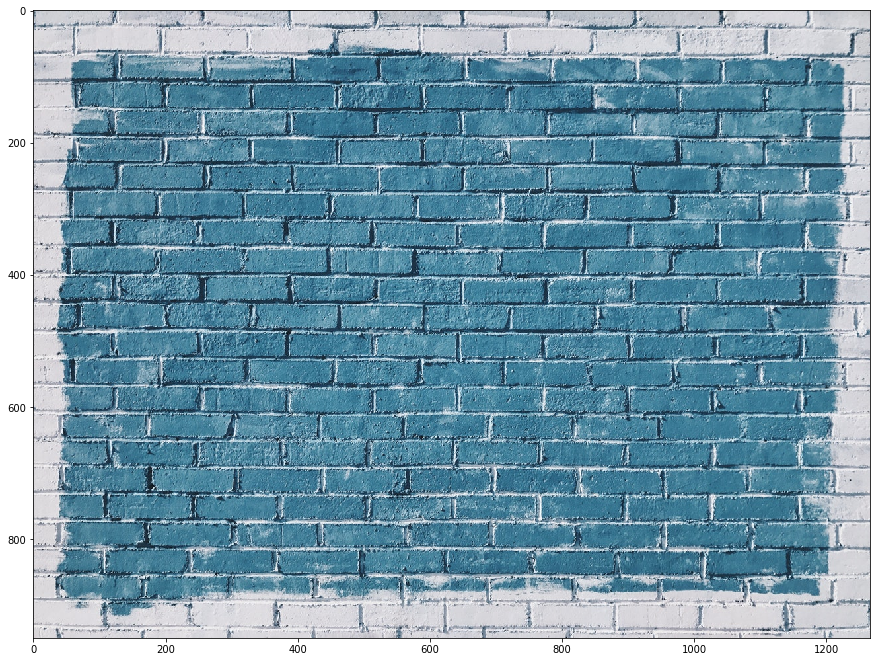

In [16]:
img = load_img()
show_pic(img)

# Gamma Correction : Practical Effect of Increasing Brightness

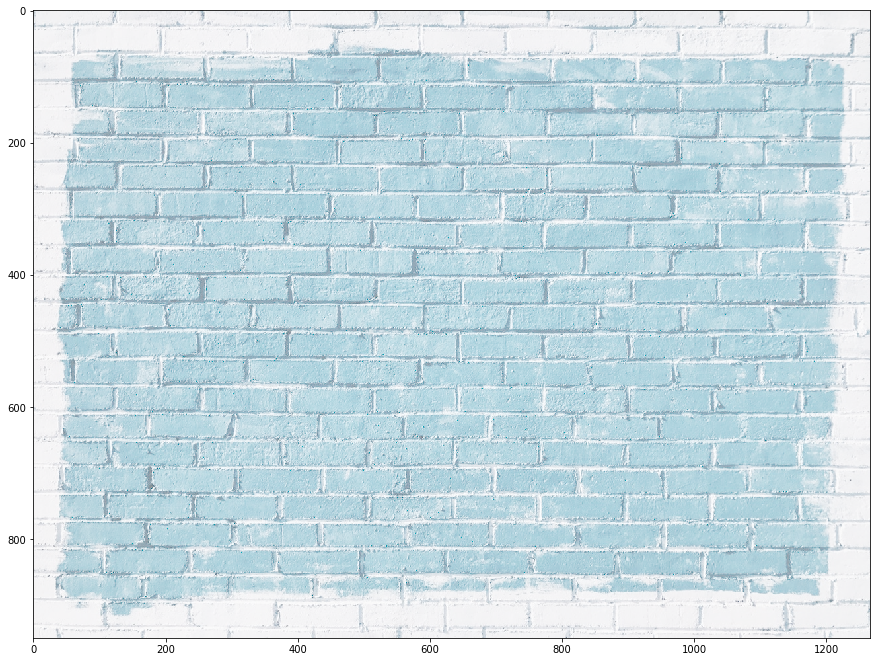

In [23]:
img = load_img()
gamma = 0.25
result = np.power(img, gamma)
show_pic(result)

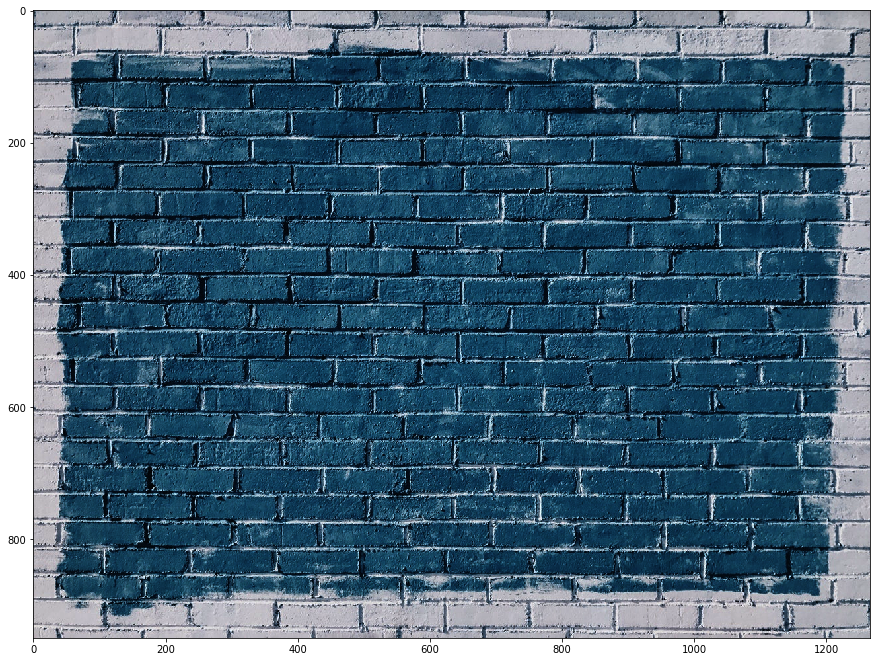

In [25]:
img = load_img()
gamma = 2
result = np.power(img, gamma)
show_pic(result)

## Adding text

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


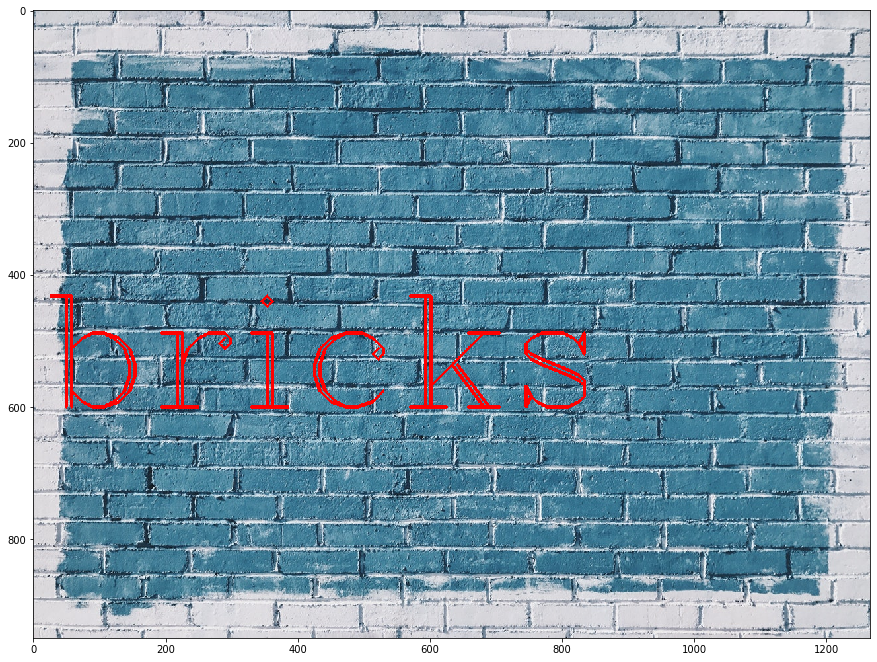

In [27]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text="bricks", org=(10,600), fontFace=font, fontScale=8, color=(255,0,0), thickness=4)
show_pic(img)

_THERE IS A WARNING SHOWN : "Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers)."_

**The reason is that if the color intensity is a float, then matplotlib expects it to range from 0 to 1. If an int, then it expects 0 to 255. So you can either force all the numbers to int or scale them all by 1/255.**

**We can use:
_np.array(img,np.int32)_  to rectify the warning explicitly**

# Low Pass Filter with a 2D Convolution

A filtering operation known as 2D convolution can be used to create a low-pass filter (explicitely defined kernels used in blurring func.)

In [28]:
kernel = np.ones(shape=(5,5))/25

In [32]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


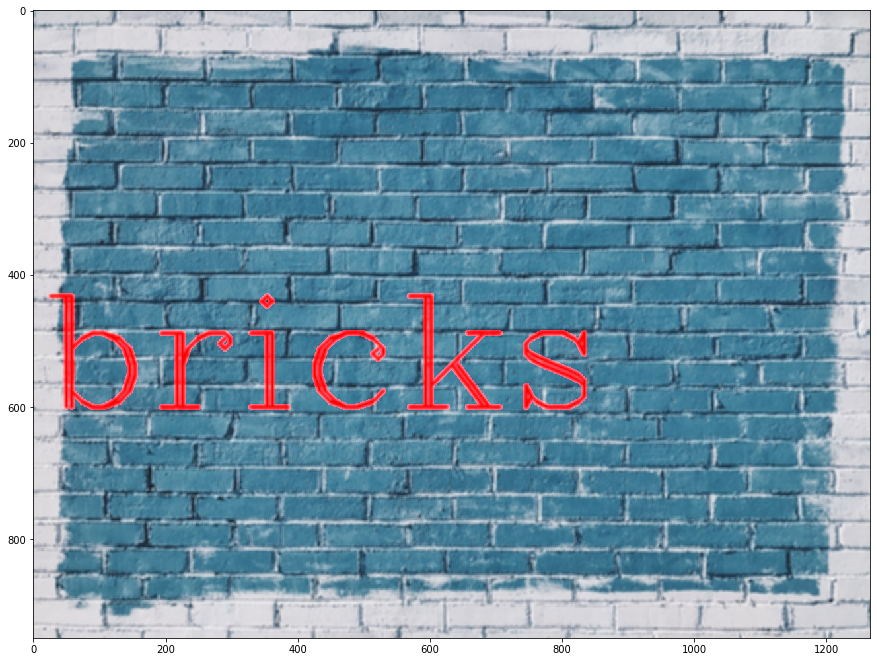

In [33]:
final = cv2.filter2D(img,-1,kernel)
show_pic(final)

**Info on what is ddepth can be found here : https://stackoverflow.com/questions/43392956/explanation-for-ddepth-parameter-in-cv2-filter2d-opencv#:~:text=You%20can%20see%20in%20the,the%20input%20(source)%20image.&text=when%20ddepth%3D%2D1%2C%20the,same%20depth%20as%20the%20source.**

_**Using the blur function of cv2.**_

You can blur an image in Python using OpenCV cv2.blur() function. Also, you can blur an image using cv2.filter2D(). But, cv2.blur() is a quick high level function for filtering action and performing an averaging.

In [38]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text="bricks", org=(10,600), fontFace=font, fontScale=8, color=(255,0,0), thickness=4)
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


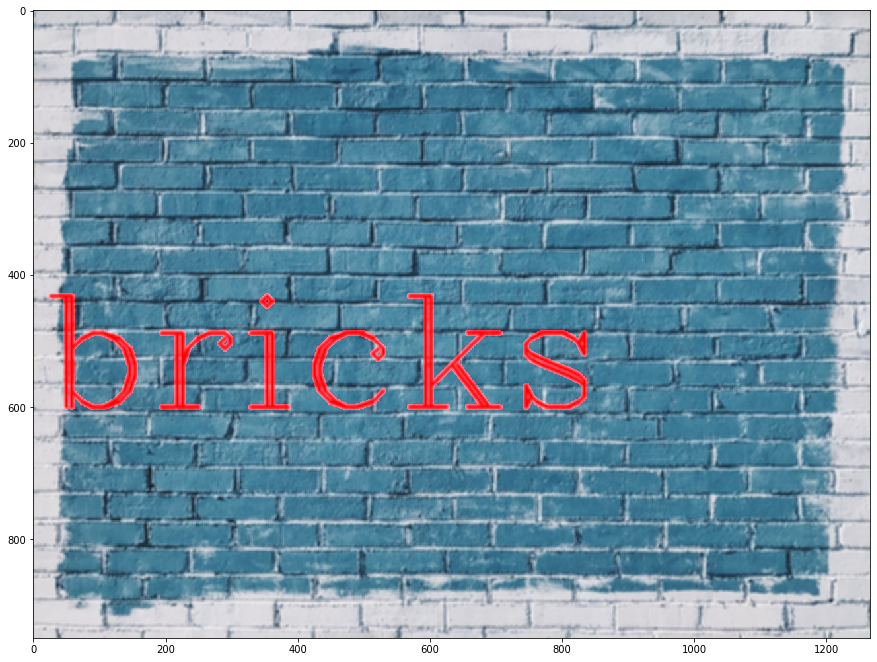

In [37]:
blurred = cv2.blur(img, ksize=(5,5))
show_pic(blurred)

# Gaussian Blur

In [39]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text="bricks", org=(10,600), fontFace=font, fontScale=8, color=(255,0,0), thickness=4)
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


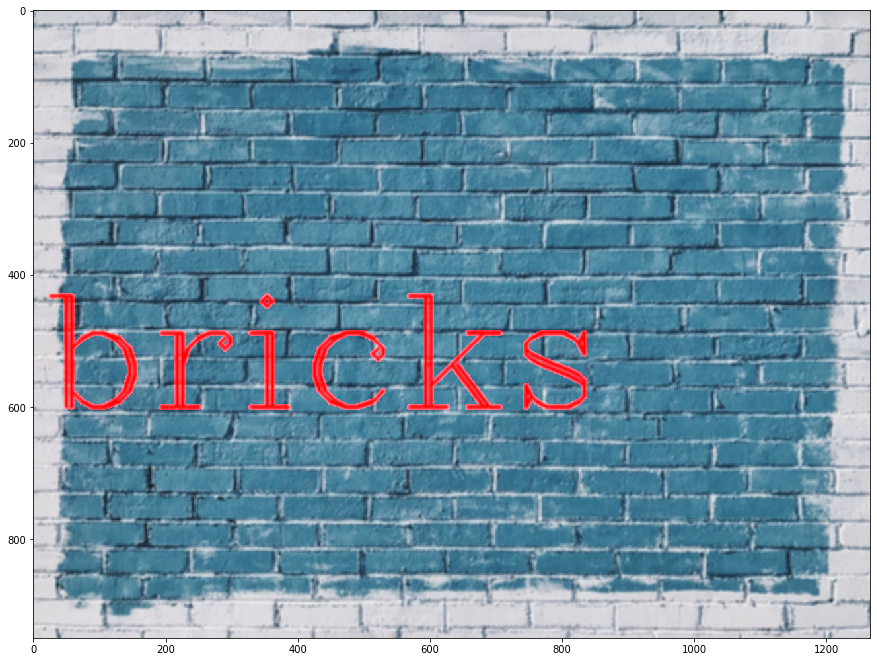

In [40]:
Gaussian_blurred = cv2.GaussianBlur(img, ksize=(5,5), sigmaX=10)
show_pic(Gaussian_blurred)

# Median Blur

In [41]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text="bricks", org=(10,600), fontFace=font, fontScale=8, color=(255,0,0), thickness=4)
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


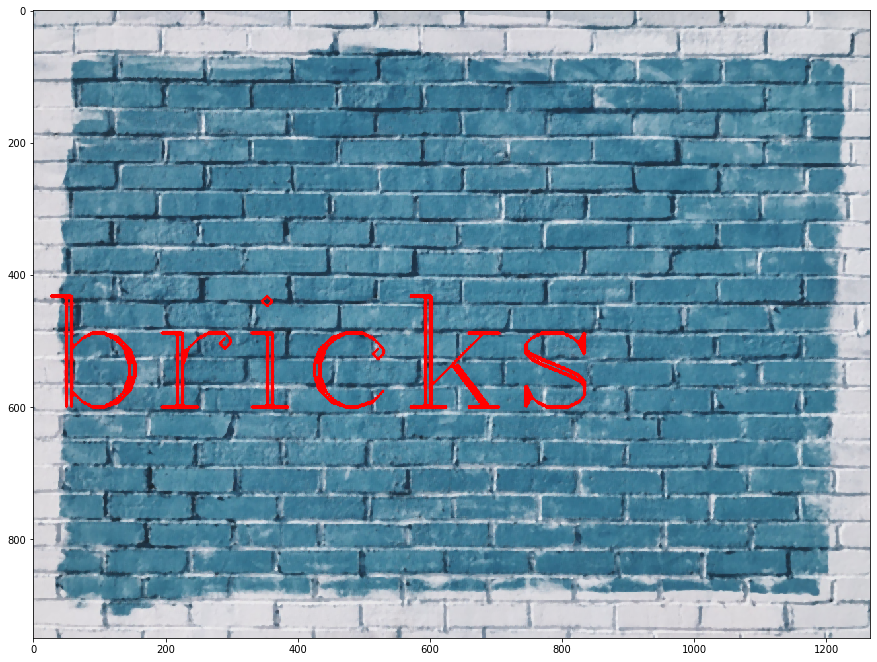

In [44]:
median_blurred = cv2.medianBlur(img, ksize=5)
show_pic(median_blurred)

# Bilateral Filter

**More info on Bilateral Filter can be found here : https://homepages.inf.ed.ac.uk/rbf/CVonline/LOCAL_COPIES/MANDUCHI1/Bilateral_Filtering.html**

In [58]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text="bricks", org=(10,600), fontFace=font, fontScale=8, color=(255,0,0), thickness=4)
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


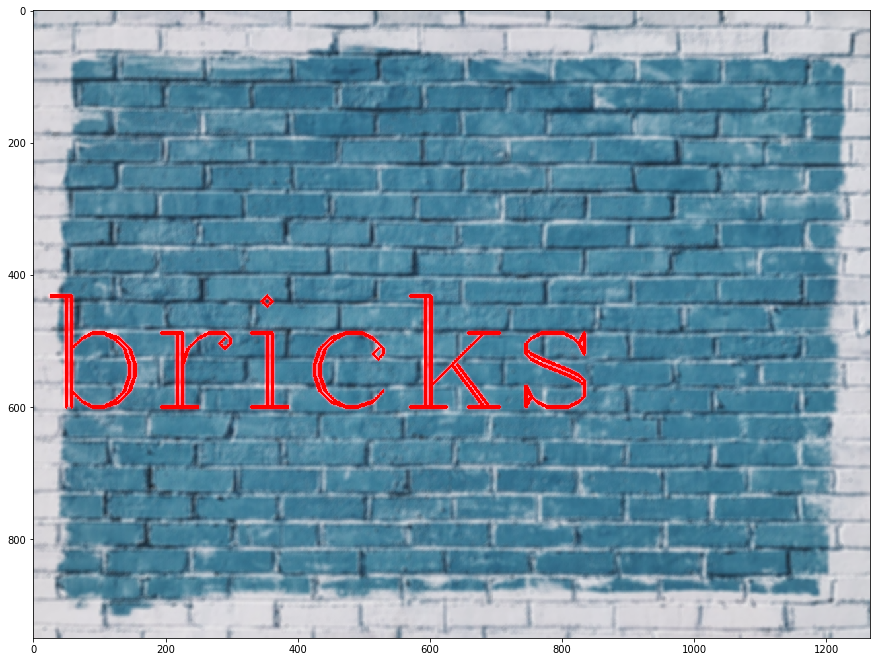

In [59]:
blur = cv2.bilateralFilter(img, d=9, sigmaColor=75, sigmaSpace=75)
show_pic(blur)

### USING A DIFFERENT IMAGE :

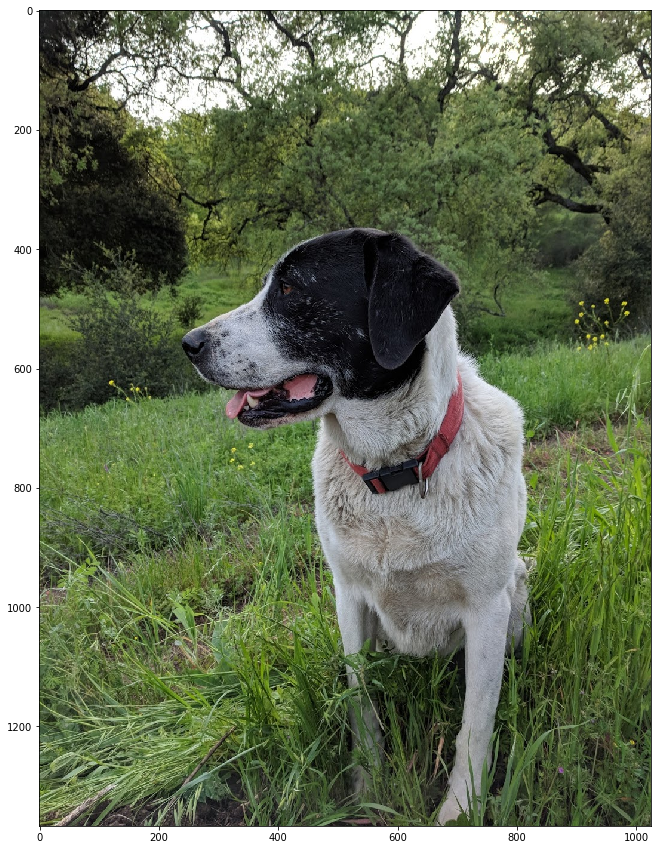

In [53]:
img = cv2.imread("C:/Users/dell/Documents/Udemy OpenCV course/sammy.jpg").astype(np.float32)/255
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
show_pic(img)

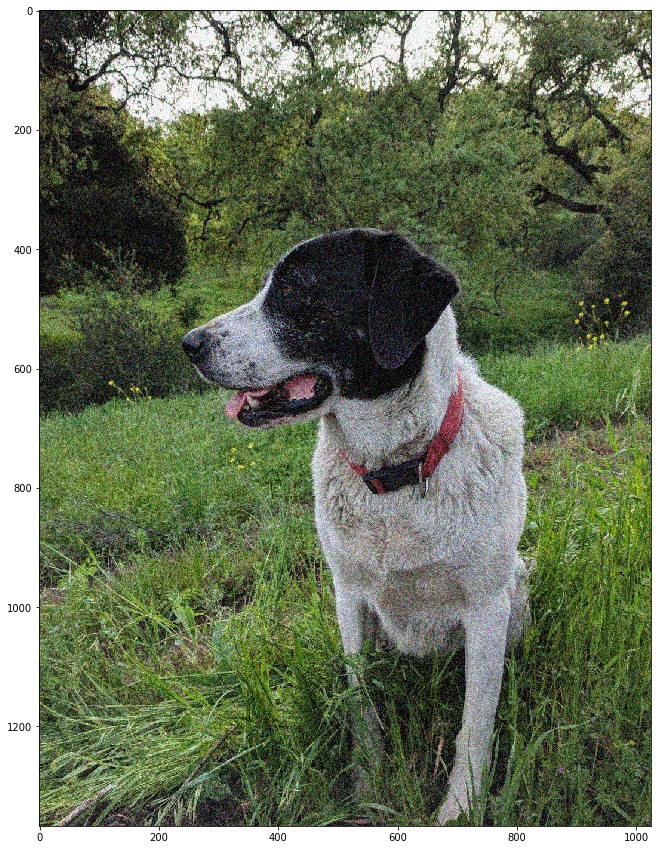

In [55]:
noisy_img = cv2.imread("C:/Users/dell/Documents/Udemy OpenCV course/sammy_noise.jpg").astype(np.float32)/255
show_pic(noisy_img)

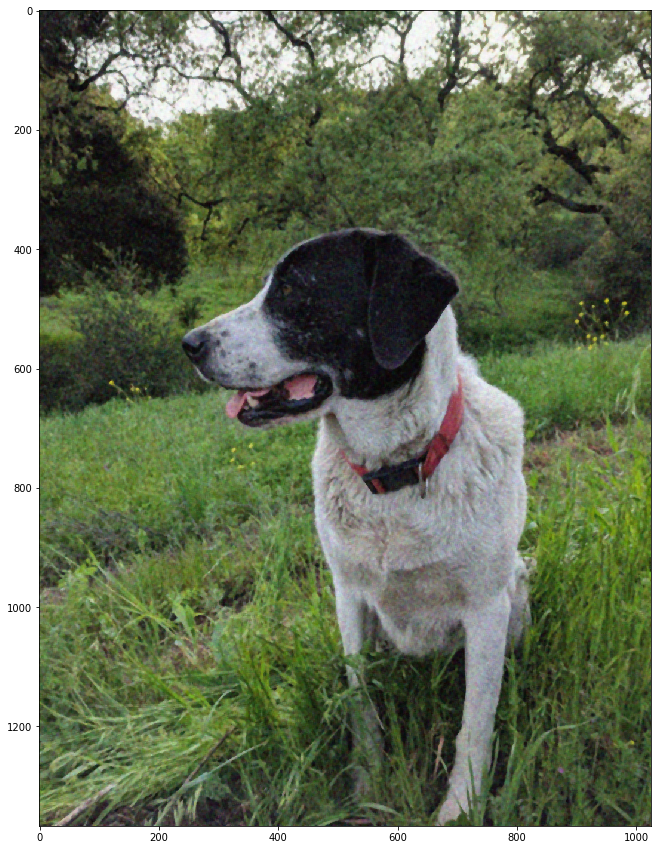

In [57]:
median_blur = cv2.medianBlur(noisy_img, 5)
show_pic(median_blur)

**An overall gist of all the filtering methods can be found here : https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_filtering/py_filtering.html**